In [2]:
# 라이브러리를 임포트합니다
import cv2                          # 필터링을 위해 opencv-python 라이브러리 사용
import numpy as np                  # 행렬 연산을 위한 numpy 라이브러리
import matplotlib.pyplot as plt     # 시각화를 위한 matplotlib 라이브러리
from sklearn.datasets import load_sample_image  # 샘플 영상 불러오기

In [3]:
# 잡음 제거 결과 시각화를 위한 함수를 정의합니다.

def show_denoising_result(input, output, gt, method):
    # 인자는 입력(잡음) 영상, 출력(잡음제거) 영상, 원본(무잡음) 영상, 기법명
    plt.figure(figsize=(20,20))  
    plt.subplot(3, 1, 1)        # (1,3)의 grid 중 1번째 그림
    plt.imshow(input)           # 입력(잡음) 영상 시각화
    plt.xlabel('noisy input')   # 가로 축 제목 달기
    plt.subplot(3, 1, 2)        # (1,3)의 grid 중 2번째 그림
    plt.imshow(output)          # 출력(잡음 제거) 영상 시각화
    plt.xlabel(method)          # 가로 축 제목 달기
    plt.subplot(3, 1, 3)        # (1,3)의 grid 중 3번째 그림
    plt.imshow(gt)              # 원본(무잡음 영상) 시각화
    plt.xlabel('Ground truth clean image')  # 가로 축 제목 달기
    plt.show()                  # plot을 보이기

In [4]:
clean_image = np.asarray(load_sample_image('china.jpg'), dtype=np.float32)/255.     # 원본 영상

# 잡음 삽입
mu = 0
sigma = 0.05
noisy_image = clean_image + np.random.normal(mu, sigma, size=np.shape(clean_image))   
print('clean_image shape', np.shape(clean_image))
print('noisy_image shape', np.shape(noisy_image))

clean_image shape (427, 640, 3)
noisy_image shape (427, 640, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


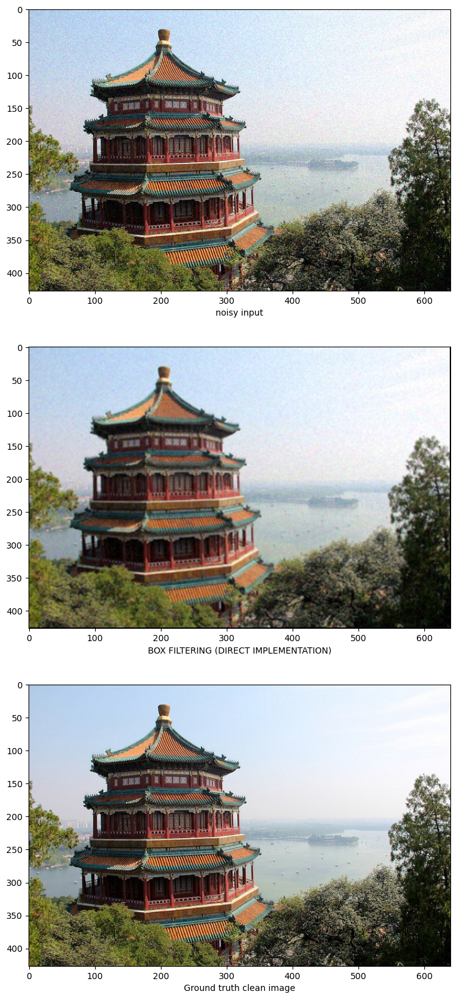

In [5]:
# Conventional 잡음 제거

# Linear Filtering
filtered_image = np.zeros_like(noisy_image)
img_height, img_width, _ = np.shape(noisy_image)     

for y in range(1, img_height-1):
    for x in range(1, img_width-1):
        filtered_image[y, x] = 1/9 * (noisy_image[y-1,x-1]+noisy_image[y-1,x]+noisy_image[y-1,x+1]+
                                      noisy_image[y  ,x-1]+noisy_image[y  ,x]+noisy_image[y  ,x+1]+
                                      noisy_image[y+1,x-1]+noisy_image[y+1,x]+noisy_image[y+1,x+1])

show_denoising_result(noisy_image, filtered_image, clean_image, 'BOX FILTERING (DIRECT IMPLEMENTATION)')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


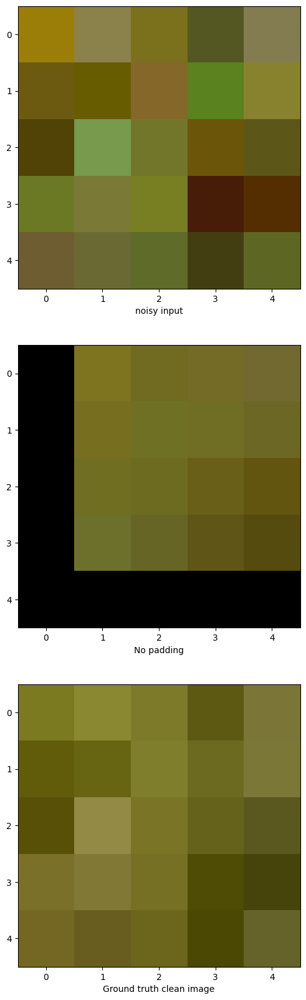

In [6]:
#  padding이 없을 때 : 영상의 가장 자리부분
show_denoising_result(noisy_image[img_height-5:img_height,0:5,:], filtered_image[img_height-5:img_height,0:5,:], clean_image[img_height-5:img_height,0:5,:], 'No padding')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


original shape (427, 640, 3)
original shape (627, 840, 3)


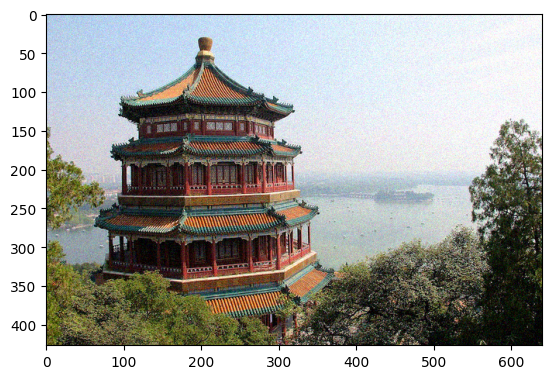

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


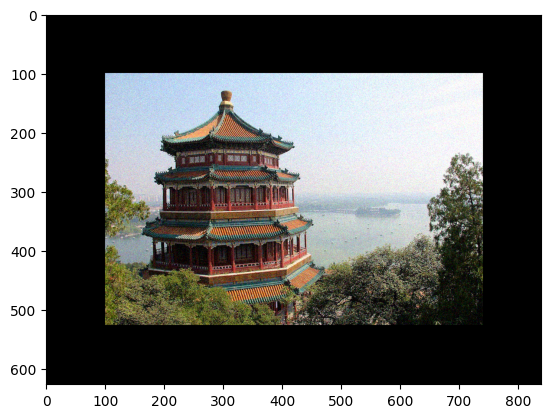

In [7]:
# BOX FILTER
# 경계부분 패딩

# 각 축방향(세로, 가로, 채널) 으로 설정한 크기만큼 패딩
pad_width = 100
noisy_image_pd = np.pad(noisy_image, ((pad_width,pad_width), (pad_width,pad_width), (0,0)))
# noisy_image_pd = noisy_image
print('original shape', np.shape(noisy_image))
print('original shape', np.shape(noisy_image_pd))
plt.imshow(noisy_image)
plt.show()
plt.imshow(noisy_image_pd)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


filtered_image2 shape (427, 640, 3)


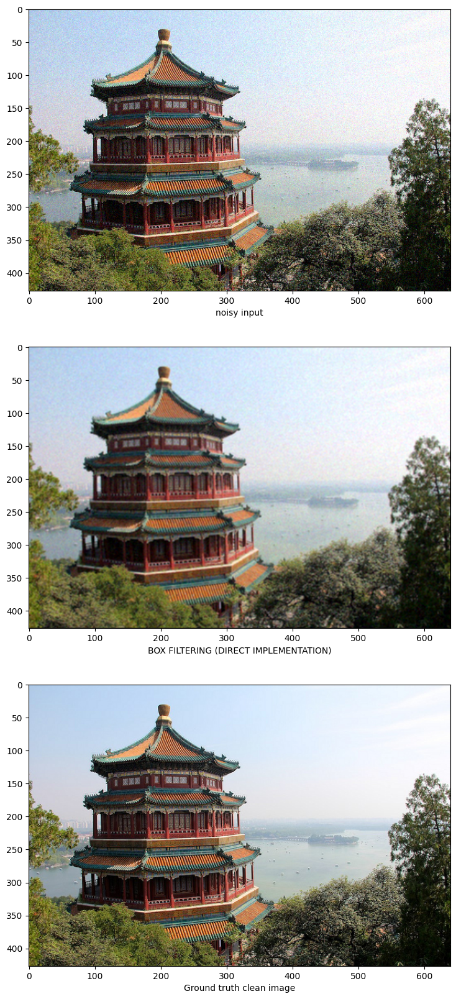

In [8]:
filtered_image2 = np.zeros_like(noisy_image_pd)
img_height, img_width, _ = np.shape(noisy_image_pd)   

for y in range(1, img_height-1):
    for x in range(1, img_width-1):
        filtered_image2[y, x] = 1/9 * (noisy_image_pd[y-1,x-1]+noisy_image_pd[y-1,x]+noisy_image_pd[y-1,x+1]+
                                      noisy_image_pd[y ,x-1]+noisy_image_pd[y  ,x]+noisy_image_pd[y  ,x+1]+
                                      noisy_image_pd[y+1,x-1]+noisy_image_pd[y+1,x]+noisy_image_pd[y+1,x+1])

# padding 영역 제거
filtered_image2 = filtered_image2[pad_width:img_height-pad_width, pad_width:img_width-pad_width, :]   
print('filtered_image2 shape', np.shape(filtered_image2))
show_denoising_result(noisy_image, filtered_image2, clean_image, 'BOX FILTERING (DIRECT IMPLEMENTATION)')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


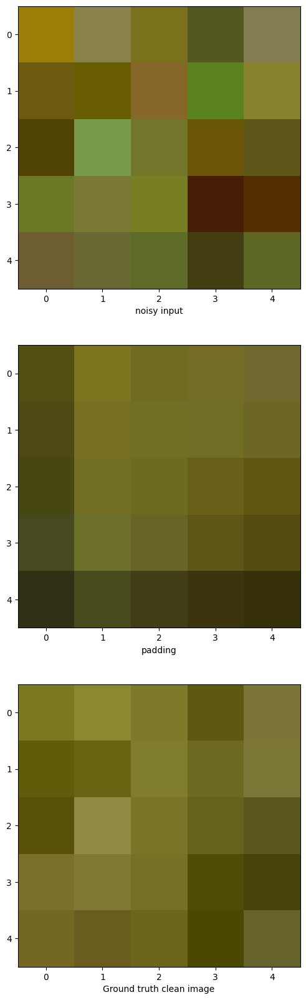

In [9]:
#  padding이 있을 때 : 영상의 가장 자리부분
img_height, img_width, _ = np.shape(filtered_image2)   
show_denoising_result(noisy_image[img_height-5:img_height,0:5,:], filtered_image2[img_height-5:img_height,0:5,:], clean_image[img_height-5:img_height,0:5,:], 'padding')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


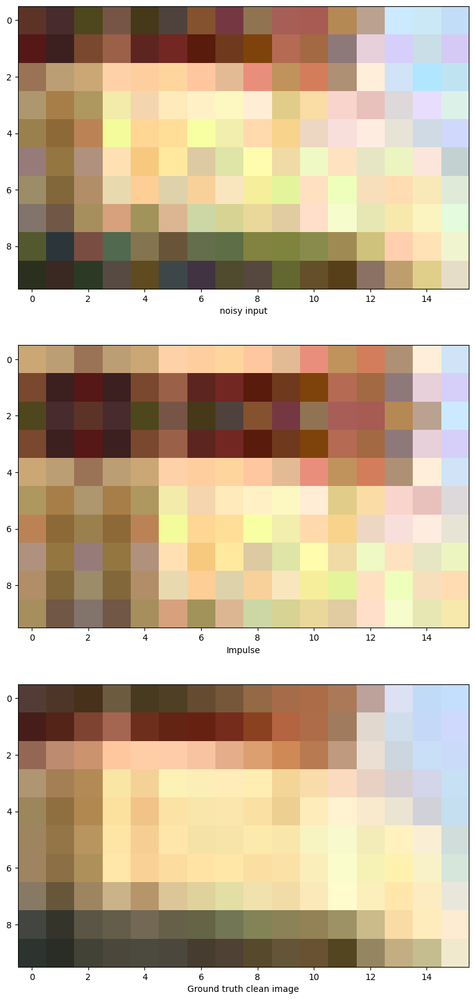

impulse kernel
 [[1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]


In [10]:
# 2D Convolution Filter 함수 사용
# # Dirac Delta = Impulse
impulse_kernel = np.asarray([[1., 0., 0., 0., 0.],
                            [0., 0., 0., 0., 0.],       
                            [0., 0., 0., 0., 0.],
                             [0., 0., 0., 0., 0.],
                             [0., 0., 0., 0., 0.]])
impulse_filtered = cv2.filter2D(noisy_image[45:55,200:216,:], ddepth=-1, kernel=impulse_kernel)
show_denoising_result(noisy_image[45:55,200:216,:], impulse_filtered, clean_image[45:55,200:216,:], 'Impulse')
print('impulse kernel\n', impulse_kernel)   # 커널 값 보기

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


box filter kernel
 [[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]


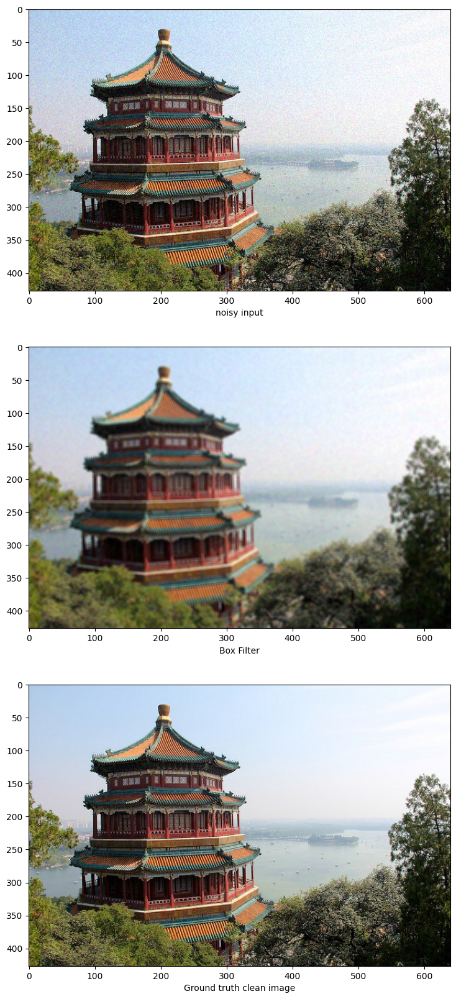

In [11]:
# BOX FILTER
box_kernel = np.ones([5, 5])/25.
print('box filter kernel\n', box_kernel)   # 커널 값 보기
box_filtered = cv2.filter2D(noisy_image, -1, box_kernel)
show_denoising_result(noisy_image, box_filtered, clean_image, 'Box Filter')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


gaussian filter kernel
 [[0.00296902 0.01330621 0.02193823 0.01330621 0.00296902]
 [0.01330621 0.0596343  0.09832033 0.0596343  0.01330621]
 [0.02193823 0.09832033 0.16210282 0.09832033 0.02193823]
 [0.01330621 0.0596343  0.09832033 0.0596343  0.01330621]
 [0.00296902 0.01330621 0.02193823 0.01330621 0.00296902]]


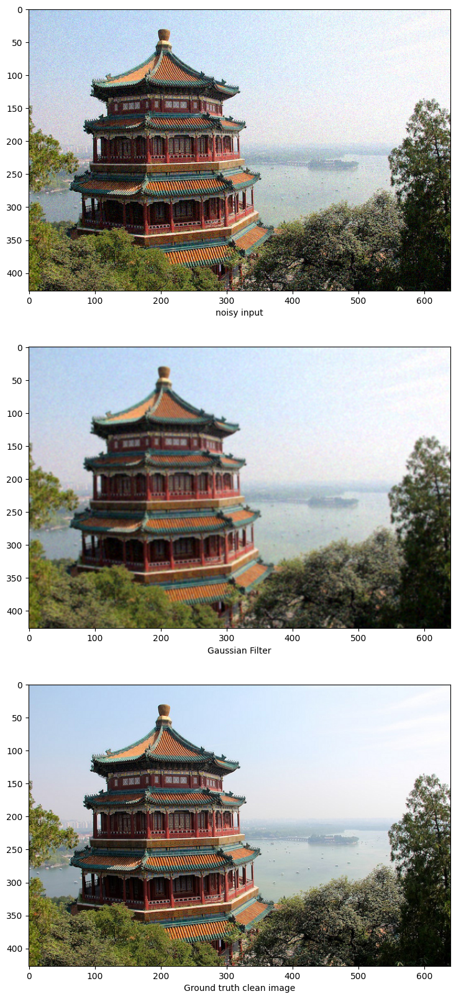

In [12]:
# GAUSSIAN FILTER
gauss_kernel_1D = cv2.getGaussianKernel(5, 1)                           # 1D Gaussian Kernel
gauss_kernel = np.outer(gauss_kernel_1D, gauss_kernel_1D.transpose())   # 자신의 transpose와 외적하여 2D 커널 생성
print('gaussian filter kernel\n', gauss_kernel)   # 커널 값 보기
gauss_filtered = cv2.filter2D(noisy_image, -1, gauss_kernel)
show_denoising_result(noisy_image, gauss_filtered, clean_image, 'Gaussian Filter')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


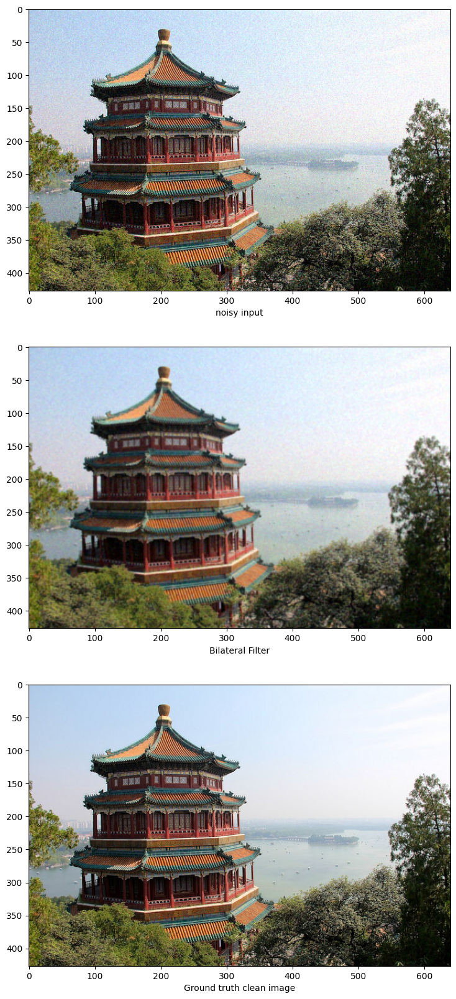

In [13]:
# BILATERAL FILTER
bilateral_filtered = cv2.bilateralFilter(noisy_image.astype(np.float32), d=5, sigmaColor=5, sigmaSpace=1)
show_denoising_result(noisy_image, bilateral_filtered, clean_image, 'Bilateral Filter')
# Bilateral Filter의 Kernel은 각 화소 위치마다 달라짐
# 값 커널의 값이 주변 화소들의 값에 따라 결정되기 때문

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


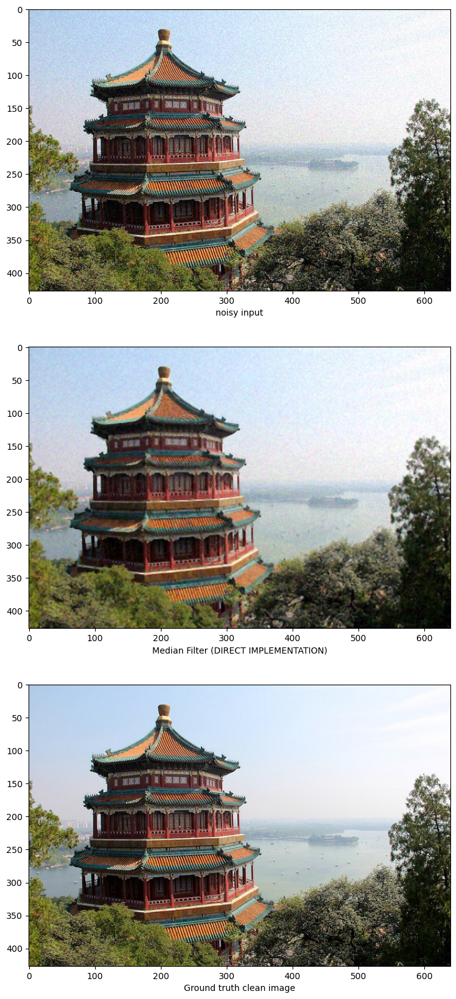

In [14]:
# MEDIAN FILTER
median_image = np.zeros_like(noisy_image_pd)
img_height, img_width, _ = np.shape(noisy_image_pd)  

for y in range(1, img_height-1):
    for x in range(1, img_width-1):
        median_image[y, x, :] = np.median(noisy_image_pd[y-1:y+2, x-1:x+2, :], axis=[0,1])

# padding 영역 제거
median_image = median_image[pad_width:img_height-pad_width, pad_width:img_width-pad_width, :]  

show_denoising_result(noisy_image, median_image, clean_image, 'Median Filter (DIRECT IMPLEMENTATION)')